# HPC Anomaly Detection: GNN training

## Preliminary steps

In [1]:
! pip install dgl torch_geometric torchviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 48.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.6/661.6 kB 53.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for torch_geometric: filename=torch_geometric-2.3.1-py3-none-any.whl size=910454 sha256=1256b33ad5779d6eb35a995c441624fe9c24d256eec8a9b1e205a5c30dced3de
  Stored in directory: /root/.cache/pip/wheels/ac/dc/30/e2874821ff308ee67dcd7a66dbde912411e19e35a1addda028
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=4130 sha256=2f5ba16a7b492ce7d8ed7cab9e0fdc821d7b6e1e0ae960bafc3fe9caeeb93fbb
  Stored in directory: /root/.cache/pip/wheels/4c/97/88/a02973217949e0db0c9f4346d154085f4725f99c4f15a87094
Successfully built torch_geometric torchviz


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
! if ! [ -d data ]; then cp -r drive/MyDrive/HPCDATA/data .; fi
! if ! [ -d utils ]; then cp -r drive/MyDrive/HPCDATA/utils .; fi

In [4]:
import itertools
import json
import logging
import os
import shutil
import random
from timeit import default_timer

import dgl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from sklearn.metrics import (auc, roc_curve, confusion_matrix,
                            ConfusionMatrixDisplay,precision_recall_curve,
                            classification_report)
from torch import nn
from torch_geometric.data import Data
from torch_geometric.loader import DataLoader
from torch_geometric.nn import GCNConv
from torchviz import make_dot

from utils.data_processing import *
from utils.training_simple import *
from utils.plotting import *

from tqdm.notebook import tqdm

DGL backend not selected or invalid.  Assuming PyTorch for now.


Setting the default backend to "pytorch". You can change it in the ~/.dgl/config.json file or export the DGLBACKEND environment variable.  Valid options are: pytorch, mxnet, tensorflow (all lowercase)


## Reproducibility

In [5]:
RANDOM_SEED = None # Set a random seed to allow for reproducibility (it will slow down computations)

def set_reproducibility(seed):
  random.seed(seed)
  np.random.seed(seed)
  torch.manual_seed(seed)
  torch.use_deterministic_algorithms(True)
  torch.backends.cudnn.deterministic = True
  torch.backends.cudnn.benchmark = False
  os.environ['CUBLAS_WORKSPACE_CONFIG']=':16:8'

def seed_worker(worker_id):
  worker_seed = torch.initial_seed() % 2**32
  np.random.seed(worker_seed)
  random.seed(worker_seed)

g = None
if RANDOM_SEED is not None:
  g = torch.Generator()
  g.manual_seed(RANDOM_SEED)
  set_reproducibility(RANDOM_SEED)

## Read and process Node Metrics

In [6]:
AGGREGATED_METRICS_PATH = "data/aggregated/"
JOB_TABLE_PATH = 'data/job_table.parquet'
RACKS_DATA_PATH = 'data/racks_spatial_distribution.json'
WINDOW_SIZE = 10
DROP_TH = 100
KEEPRACKS = np.arange(23,28)
KEEPNODES = np.arange(460,559).astype(str) # set it no None if you don't want to filter nodes
KEEPNODES = KEEPNODES[KEEPNODES!='537']

In [7]:
data = load_metrics(AGGREGATED_METRICS_PATH,racks=KEEPRACKS)
data = process_metrics(data,KEEPNODES,DROP_TH)
data.head()

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

,timestamp,460,461,463,464,465,467,468,469,470,...,551,552,553,554,555,556,557,558,values,anomalies
0,2022-03-31 02:45:00+00:00,"[0.539976015665201, 0.5405405022263785, 0.5315...","[0.3955845662662844, 0.40540536593020815, 0.37...","[0.4160699413210467, 0.43243241037276337, 0.38...","[0.46081933488446114, 0.47747745580482015, 0.4...","[0.4759347584335139, 0.48648649925787385, 0.45...","[0.5871120678300974, 0.6036036345645427, 0.576...","[0.5280428440482905, 0.5495495456794321, 0.504...","[0.5684167170740713, 0.5945945911114889, 0.540...","[0.612370456611576, 0.6216216355540441, 0.6036...",...,"[0.6630866180691942, 0.6756756385225489, 0.657...","[0.7486076813237196, 0.7477477283971609, 0.747...","[0.7484088436863042, 0.7477477283971609, 0.756...","[0.7758549927365993, 0.7837838162927697, 0.783...","[0.8110581160655834, 0.8108107748187192, 0.819...","[0.7800315542463185, 0.7837838162927697, 0.783...","[0.8337308265224157, 0.8378378192612744, 0.837...","[25.564450412326387, 25.799999237060547, 25.39...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
1,2022-03-31 03:00:00+00:00,"[0.5129274204992378, 0.5045045002473754, 0.522...","[0.3570007782344892, 0.3513513629617035, 0.360...","[0.3747015766319405, 0.36936936395120507, 0.37...","[0.41865537686469456, 0.4144144093832618, 0.42...","[0.4331741661110016, 0.4234234528363155, 0.432...","[0.5624501919608657, 0.5585585891324859, 0.558...","[0.49602203334669837, 0.4954954567943217, 0.49...","[0.5397770566372865, 0.5495495456794321, 0.531...","[0.590095239343826, 0.5855855476584353, 0.5945...",...,"[0.6591088941968907, 0.6666666809861009, 0.639...","[0.7482098846583893, 0.7477477283971609, 0.738...","[0.749403031873382, 0.7477477283971609, 0.7567...","[0.7750595207964381, 0.7747747728397161, 0.774...","[0.810262401344424, 0.8108107748187192, 0.8108...","[0.7800316756368176, 0.7837838162927697, 0.783...","[0.832338720279509, 0.8378378192612744, 0.8378...","[25.533336046006944, 25.799999237060547, 25.39...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
2,2022-03-31 03:15:00+00:00,"[0.5151152414633041, 0.5045045002473754, 0.522...","[0.360381867804047, 0.3513513629617035, 0.3603...","[0.37708811384292334, 0.3783784074042587, 0.37...","[0.4196496864422715, 0.4234234528363155, 0.423...","[0.4321796744476762, 0.43243241037276337, 0.43...","[0.5626489689030316, 0.5675675466689337, 0.558...","[0.492442227530224, 0.4954954567943217, 0.4774...","[0.5385837880317951, 0.5495495456794321, 0.522...","[0.5922830603078925, 0.6036036345645427, 0.594...",...,"[0.649562259790963, 0.6576576375330473, 0.6306...","[0.7400557206668658, 0.7387387708607129, 0.738...","[0.7420443398220197, 0.7387387708607129, 0.747...","[0.7690928135974837, 0.7657657293866624, 0.774...","[0.8062846774721205, 0.8018018172822713, 0.810...","[0.7746619669121062, 0.7747747728397161, 0.774...","[0.8287589144630344, 0.8198198182717729, 0.837...","[25.457777235243057, 25.600000381469727, 25.20...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, ...","[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, ..."
3,2022-03-31 03:30:00+00:00,"[0.5079552656588584, 0.5045045002473754, 0.513...","[0.3534208510275159, 0.3513513629617035, 0.360...","[0.3729116130284538, 0.3783784074042587, 0.378...","[0.4188542751973597, 0.4234234528363155, 0.414...","[0.4349641904097378, 0.45045041136226494, 0.43...","[0.5670245501359148, 0.5675675466689337, 0.558...","[0.4996021426394202, 0.5135135437004291, 0.495...","[0.5459426014736564, 0.5585585891324859, 0.540...","[0.5956641498774502, 0.5945945911114889, 0.594...",...,"[0.6549322719919222, 0.6666666809861009, 0.648...","[0.7452264703636629, 0.7477477283971609, 0.747...","[0.7452264703636629, 0.7387387708607129, 0.756...","[0.7716784312268805, 0.7657657293866624, 0.774...","[0.8080744589898586, 0.8018018172822713, 0.810...","[0.777843733282252, 0.7747747728397161, 0.7837...","[0.8311456944550154, 0.8288

## Read Jobs and Racks Tables

In [8]:
node_columns = data.columns[1:-3]
nodes = list(node_columns.astype(int))

racks = pd.read_json(RACKS_DATA_PATH)

jobtable = pd.read_parquet(JOB_TABLE_PATH)[['start_time','end_time','nodes']]
jobtable = jobtable.dropna(subset=['nodes'])
jobtable.nodes = jobtable.nodes.map(lambda x:np.fromstring(x.strip(']['),dtype=int,sep=',')) # map nodelist from str to array
jobtable.nodes = jobtable.nodes.map(lambda a : np.intersect1d(a,nodes)) # Keep only jobs where the selected nodes appear
jobtable = jobtable[jobtable.nodes.map(len)>0] # Drop rows without any node of interest
jobtable = jobtable.reset_index() # Not really necessary, but meh
print("Data covering the period from {} to {}".format(jobtable.start_time.min().date(),jobtable.end_time.max().date()))
jobtable.head()

Data covering the period from 2022-03-31 to 2022-04-30


,index,start_time,end_time,nodes
0,19,2022-04-02 05:36:25+00:00,2022-04-02 13:23:12+00:00,"[529, 530, 531, 532, 533, 534, 535, 536]"
1,780,2022-04-01 23:28:45+00:00,2022-04-01 23:29:22+00:00,"[467, 493, 494, 495, 512, 513, 514]"
2,2096,2022-04-02 16:09:02+00:00,2022-04-02 16:11:31+00:00,"[474, 491, 512, 536, 552]"
3,2953,2022-04-08 22:16:15+00:00,2022-04-09 05:46:26+00:00,"[463, 464, 488, 489, 507, 512, 513, 522, 542]"
4,3015,2022-04-09 06:01:58+00:00,2022-04-09 06:02:12+00:00,[464]


## Create graphs

In [9]:
def build_graph(jobs):
  edge_list = jobs.nodes.map(lambda x: list(itertools.permutations(x,2))) # build edgelist for each node
  edge_list = edge_list[edge_list.map(len) > 0]
  if len(edge_list) > 0:
    true_edges = np.concatenate(edge_list.values) # remove empty list and collect all
    heatmap = build_heatmap(true_edges)

  else:
    heatmap = np.zeros((980,980))
    true_edges = np.empty(0)

  src,dst = np.nonzero(heatmap)
  graph = dgl.graph((src,dst),num_nodes=980)

  eweights = torch.tensor(heatmap[heatmap.nonzero()],dtype=torch.float32)

  graph = dgl.graph((src,dst),num_nodes=980)
  graph.edata['eweight'] = eweights

  # Drop nodes not contained in the dataset
  drop_nids = [i for i in range(980) if str(i) not in data.columns]
  graph = dgl.remove_nodes(graph, drop_nids, store_ids=True)

  # Add self loops
  graph = dgl.add_self_loop(graph)
  return graph

In [21]:
data_list = []

for i,row in tqdm(data.iterrows(), total=len(data)):
    timestamp = row['timestamp']
    jobs = jobtable[(jobtable['start_time']<timestamp) & (jobtable['end_time']>timestamp)]
    if len(jobs) > 0:
      graph = build_graph(jobs)
      # Graph changes, so are the weights
      eweights = graph.edata['eweight']
      edge_index = torch.stack(graph.edges())
      x = torch.tensor(np.stack(row.iloc[1:-2]),dtype = torch.float32)
      a = torch.tensor(row['anomalies'])
      g = Data(edge_index=edge_index,x=x,edge_weight = eweights,anomalies=a)
      data_list.append(g)

  0%|          | 0/2963 [00:00<?, ?it/s]

## Model Definition & Training Setup

In [11]:
class anomaly_anticipation(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        #encoder
        self.conv1 = GCNConv(in_channels, 300)
        self.conv2 = GCNConv(300, 100)
        self.conv3 = GCNConv(100, out_channels)

        #dense layer
        self.fc1 = torch.nn.Linear(out_channels,16)
        self.fc2 = torch.nn.Linear(16,1)

    def forward(self, x, edge_index,edge_weight=None):
        x = self.conv1(x, edge_index,edge_weight).relu()
        x = self.conv2(x, edge_index,edge_weight).relu()
        x = self.conv3(x, edge_index,edge_weight).relu()
        x = self.fc1(x)
        x = self.fc2(x)
        return x

conv1.bias torch.Size([300]) 300
conv1.lin.weight torch.Size([300, 416]) 124800
conv2.bias torch.Size([100]) 100
conv2.lin.weight torch.Size([100, 300]) 30000
conv3.bias torch.Size([16]) 16
conv3.lin.weight torch.Size([16, 100]) 1600
fc1.weight torch.Size([16, 16]) 256
fc1.bias torch.Size([16]) 16
fc2.weight torch.Size([1, 16]) 16
fc2.bias torch.Size([1]) 1
Total trainable Params: 157105


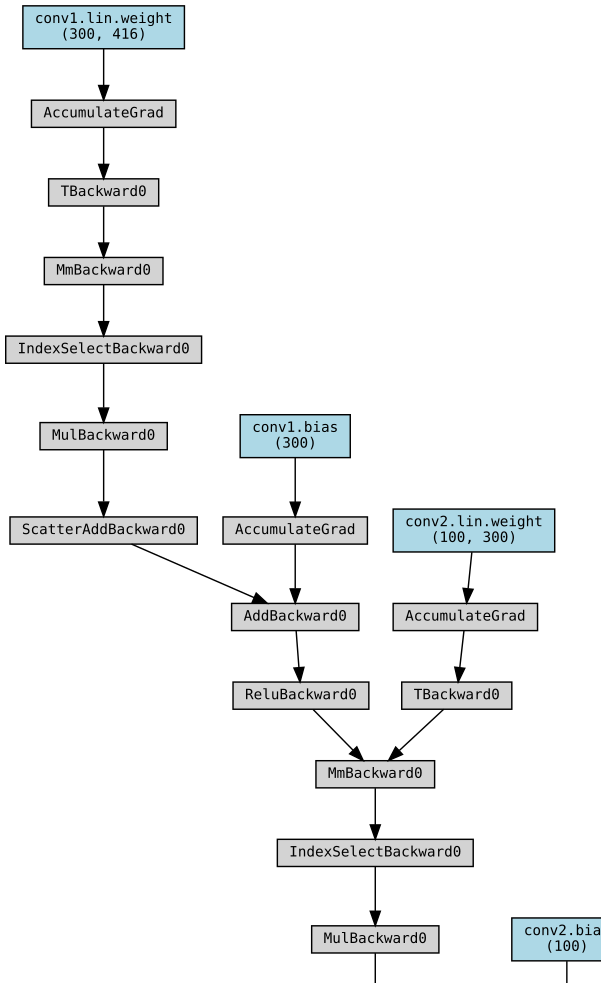

In [12]:
# Create model
in_channels, out_channels = data_list[0].x.shape[1], 16
model = anomaly_anticipation(in_channels,out_channels)

tot_params = 0
for name,param in model.named_parameters():
    print(name,param.shape,param.numel())
    tot_params += param.numel()
print('Total trainable Params:',tot_params)

# Make a forward pass
g = data_list[0]
x = g.x
out = model (x,g.edge_index,g.edge_weight)

# Backtrack to draw the computational graph
make_dot(out, params=dict(list(model.named_parameters())))

In [28]:
def train(train_data, logpath, logger_name, device, num_epochs, initial_lr, batch_size,es_patience, es_min_delta = 0, max_num_ckpt=-1, apply_weight_balancing = False):

  # Create model
  in_channels, out_channels = train_data[0].x.shape[1], 16
  model = anomaly_anticipation(in_channels,out_channels).to(device)

  # Prepare dataloader
  train_loader = DataLoader(train_data, batch_size = batch_size, shuffle = False)

  # Compute weight balancing
  pos_weight = None
  if APPLY_WEIGHT_BALANCING:
    train_labels = torch.cat([g.y for g in train_data])
    train_ones = len(train_labels.nonzero())
    train_zeros = len(train_labels)-train_ones
    pos_weight = torch.tensor(train_zeros/train_ones) * 100
    # pos_weight = torch.tensor(train_ones/train_zeros)

  # Set up training
  criterion = torch.nn.BCEWithLogitsLoss(weight = pos_weight)
  optimizer = torch.optim.Adam([p for p in model.parameters()],lr = initial_lr)
  scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer,T_max=num_epochs,eta_min=initial_lr * 1e-1)
  trainer =  MyTrainer(model,
                       optimizer,
                       scheduler,
                       es_patience,
                       es_min_delta,
                       max_num_ckpt)

  trainer.train(num_epochs,criterion,train_loader,logger_name,device,logpath)
  model.load_state_dict(torch.load(os.path.join(logpath,'BestModel/best-model.pt'))['model'])
  return model

def get_predictions(model,dataloader,device):
    model.eval()

    preds = []
    y_true = []
    anomalies = []

    with torch.no_grad():
        for g in tqdm(dataloader):
            g = g.to(device)

            # Forward pass
            logits = model(g.x,g.edge_index,g.edge_weight).squeeze()

            pred = torch.sigmoid(logits)
            preds.append(pred.detach().cpu().numpy())
            y_true.append(g.y.detach().cpu().numpy())
            anomalies.append(g.anomalies.cpu().numpy())
    preds = np.concatenate(preds).astype(float)
    y_true = np.concatenate(y_true).astype(int)
    anomalies = np.concatenate(anomalies).astype(int)

    return pd.DataFrame({'prob': preds,'true_class': y_true,'anomaly':anomalies})

## Training Setup

In [14]:
TRAIN_SPLIT = 0.7
NUM_EPOCHS = 200
INITIAL_LR = 1e-3

TRAIN_BATCH_SIZE = 64
TEST_BATCH_SIZE = 64

ES_PATIENCE = 50
ES_MIN_DELTA = 0

APPLY_WEIGHT_BALANCING = True # whether to use weight balancing inside the loss

LOGGER_NAME = f'train.output'
BASE_LOGPATH = f'out'

MAX_NUM_CKPT = 10

In [15]:
# Select device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Available device:',device)

if not os.path.exists(BASE_LOGPATH):
  os.makedirs(BASE_LOGPATH)

Available device: cuda


# Window size 4

In [16]:
model = anomaly_anticipation(23,1).to(device)

In [24]:
window_size = 4
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g.y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [25]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT)
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device,  NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA, MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 3848.6017212964657, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 867.5658304339864, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 659.9587987548068, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 643.4442409815052, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 635.0709119208936, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 612.6756088628456, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 588.1560153817982, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 580.0657846548252, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 548.0205090642739, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 515.8814777513276, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 478.9223585423915, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 457.46136238784106, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 441.18449002014285, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 428.08134956967587, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 419.19872733931516, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 410.17350302142466, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 408.20989745467864, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 402.368888481963, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 398.48448086431057, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 395.1191173777696, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 396.4088079106391, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 398.59485442226696, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 389.1123878410547, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 387.4368705365318, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 384.1966672770555, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 382.7334737227614, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 380.03605108954406, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 378.7183665995239, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 376.7550585973265, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 375.3227659769273, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 372.0653039736312, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 370.1427852041751, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 366.4002243178905, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 367.25189983519505, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 363.7096456692913, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 361.06429683208205, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 359.6641640725142, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 356.36257095770003, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 356.312534334371, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 352.6579381065739, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 350.8456784471708, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 349.57260574986265, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 348.3151895257279, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 345.19909357260576, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 345.9123557956418, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 343.2681514374657, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 342.9675654642007, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 337.6729994506501, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 357.4832677165354, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 338.5435588720015, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 346.5351583958982, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 342.71575718732834, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 333.85954953305253, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 329.62257370444974, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 333.820477018861, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 328.53000824024906, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 328.4198406885186, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 326.9403726423732, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 321.52980223402307, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 326.8400933894891, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 320.89484526643474, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 337.57496337667095, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 317.5970518220106, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 332.7694332539828, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 327.0001831166453, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 318.1886559238235, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 317.7636421900751, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 314.0613669657572, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 318.39624153085515, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 314.79351309284016, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 313.1961179271196, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 313.6326908991027, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 307.8199276689251, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 310.78438015015564, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 316.4713651345907, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 303.0410867972899, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 319.26304706097784, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 312.4915995238967, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 308.5848516755173, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 305.9376487822743, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 303.1175837758652, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 304.88097418055304, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 303.9580433986449, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 304.79383354696944, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 304.7579655740707, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 306.1248168833547, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 300.34183299761946, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 298.22429500091556, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 302.630905511811, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 293.03973631203075, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 301.4740432155283, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 300.37584691448455, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 297.5117423548801, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 296.0136879692364, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 293.39500549349935, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 291.55379051455776, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 290.19318806079474, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 289.9387017029848, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 287.9939342611243, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 291.2915674784838, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 291.90377220289326, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 288.71715345174874, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 286.3949139351767, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 284.48535066837576, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 284.1865500824025, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 285.3525453213697, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 281.57070591466766, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 284.5517304522981, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 283.8922129646585, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 281.88964933162424, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 280.7108588170665, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 279.29468046145394, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 277.36035066837576, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 277.51384819630107, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 275.77636879692363, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 277.2759567844717, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 275.8223310748947, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 274.5824482695477, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 272.07901483244825, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 270.371062992126, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 269.997962827321, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 271.00780534700607, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 269.0639534883721, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 269.2450100714155, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 269.54630562168103, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 268.7263321735946, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 266.50318165171217, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 265.3424967954587, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 263.96790880791065, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 264.030351583959, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 262.7028474638345, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 261.52433162424467, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 260.54701519868155, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 258.76112433620216, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 257.80466031862295, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 257.2879051455777, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 255.5835011902582, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 254.2365638161509, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 254.165194103644, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 252.88514008423365, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 252.25306720380883, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 250.82963285112618, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 250.80921534517486, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 251.07729811389856, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 251.0711179271196, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 248.3614951474089, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 246.89958340963193, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 246.3317158029665, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 245.33865134590735, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 244.23519044131112, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 243.38051638893975, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 242.09636513459074, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 240.68838124885553, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 240.18806079472625, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 239.02098974546786, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 238.16404962461087, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 237.30495788317157, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 236.76538179820545, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 236.21994598058964, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 234.56665445889033, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 233.5269410364402, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 233.4120582310932, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 232.4391366050174, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 231.99372825489837, Train Acc at 50%: 0.9981344991759751


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 230.83574436916317, Train Acc at 50%: 0.9981402215711408


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 230.45735671122506, Train Acc at 50%: 0.9981402215711408


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 229.1694515656473, Train Acc at 50%: 0.9981459439663065


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 228.43863303424283, Train Acc at 50%: 0.9981459439663065


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 228.05841420985166, Train Acc at 50%: 0.9981459439663065


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 227.51174235488006, Train Acc at 50%: 0.9981631111518037


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 227.18082768723676, Train Acc at 50%: 0.9981631111518037


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 225.987982970152, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 224.93380333272293, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 224.93879326130747, Train Acc at 50%: 0.9981631111518037


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 224.08638527742173, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 224.16498809741805, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 222.80120399194286, Train Acc at 50%: 0.9981860007324665


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 222.26771653543307, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 221.94556857718368, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 221.66610968687053, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 220.67098516755172, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 220.3012955502655, Train Acc at 50%: 0.9981745559421351


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 219.7576451199414, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 219.43769456143565, Train Acc at 50%: 0.9981745559421351


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 219.25297564548617, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 218.29687786119757, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 217.95586888848197, Train Acc at 50%: 0.9981745559421351


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 217.5287264237319, Train Acc at 50%: 0.9981745559421351


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 217.01389397546237, Train Acc at 50%: 0.9981745559421351


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 216.94195202343894, Train Acc at 50%: 0.9981745559421351


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 216.40562625892693, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 215.7274995422084, Train Acc at 50%: 0.9981802783373008


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 215.38909998168833, Train Acc at 50%: 0.9981745559421351


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 215.13793261307453, Train Acc at 50%: 0.9981745559421351


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 214.8035845083318, Train Acc at 50%: 0.9981745559421351


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 214.2798480131844, Train Acc at 50%: 0.9981688335469694


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 213.69236403589088, Train Acc at 50%: 0.9981745559421351


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 213.6475691265336, Train Acc at 50%: 0.9981745559421351


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 213.4166819263871, Train Acc at 50%: 0.9981631111518037


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 212.83105200512728, Train Acc at 50%: 0.998157388756638


In [29]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

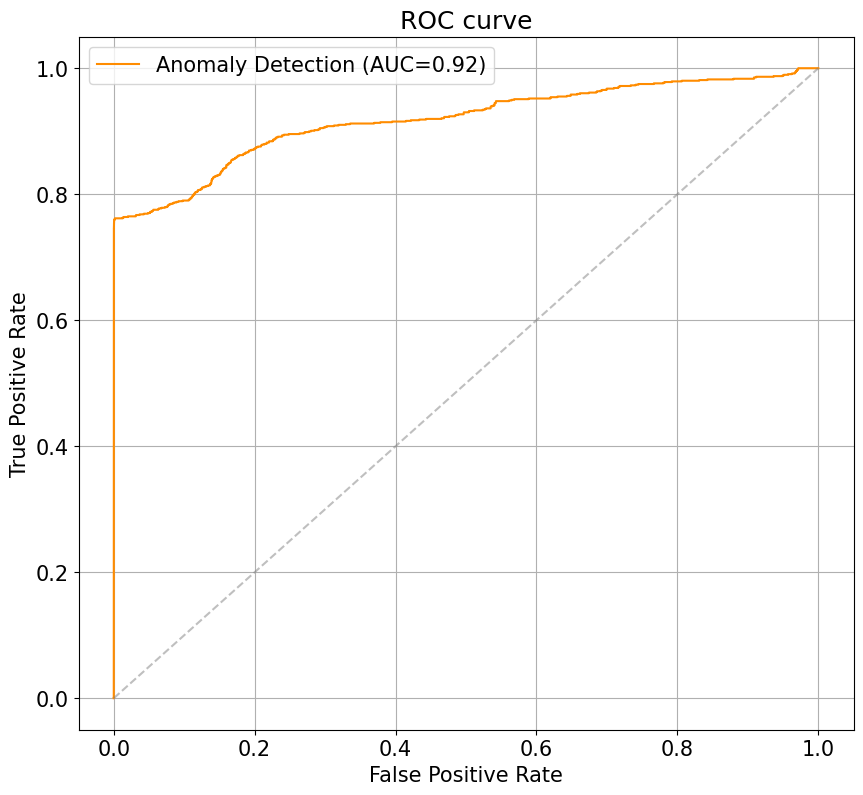


Best probability threshold: p=3.22%


In [33]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

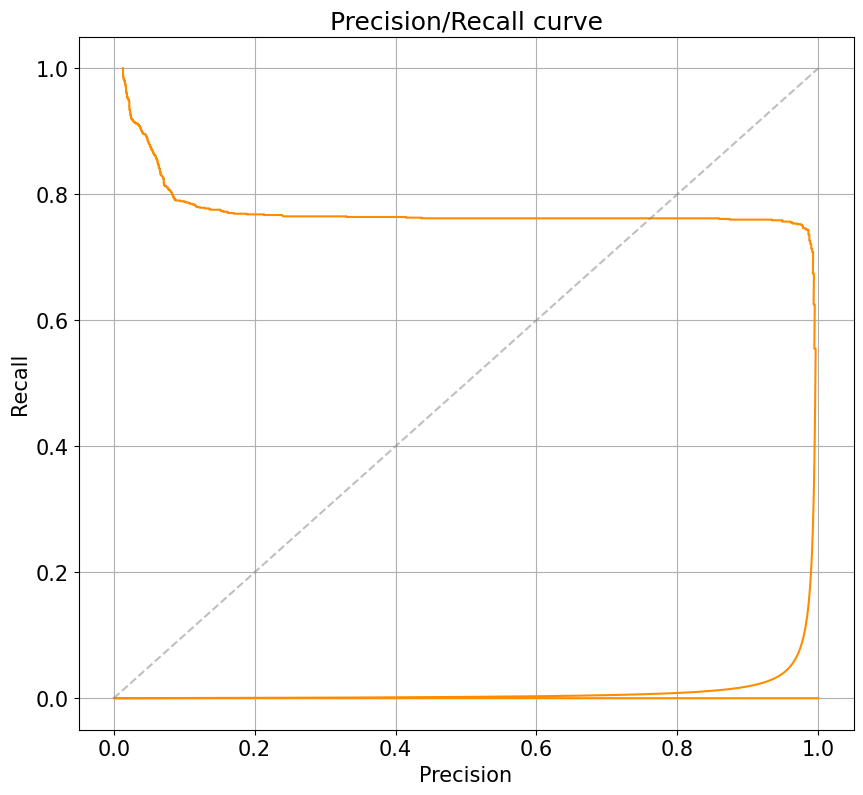

In [34]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

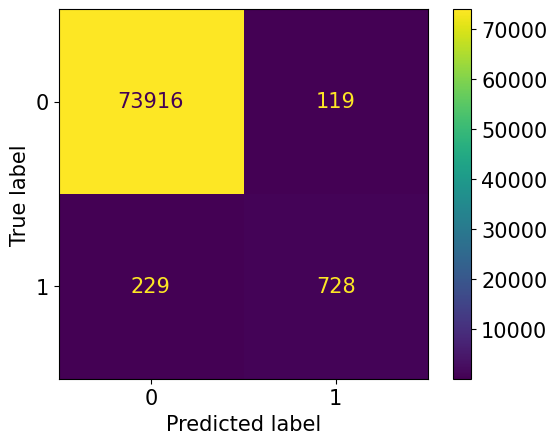


Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     74035
           1       0.86      0.76      0.81       957

    accuracy                           1.00     74992
   macro avg       0.93      0.88      0.90     74992
weighted avg       1.00      1.00      1.00     74992



In [35]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

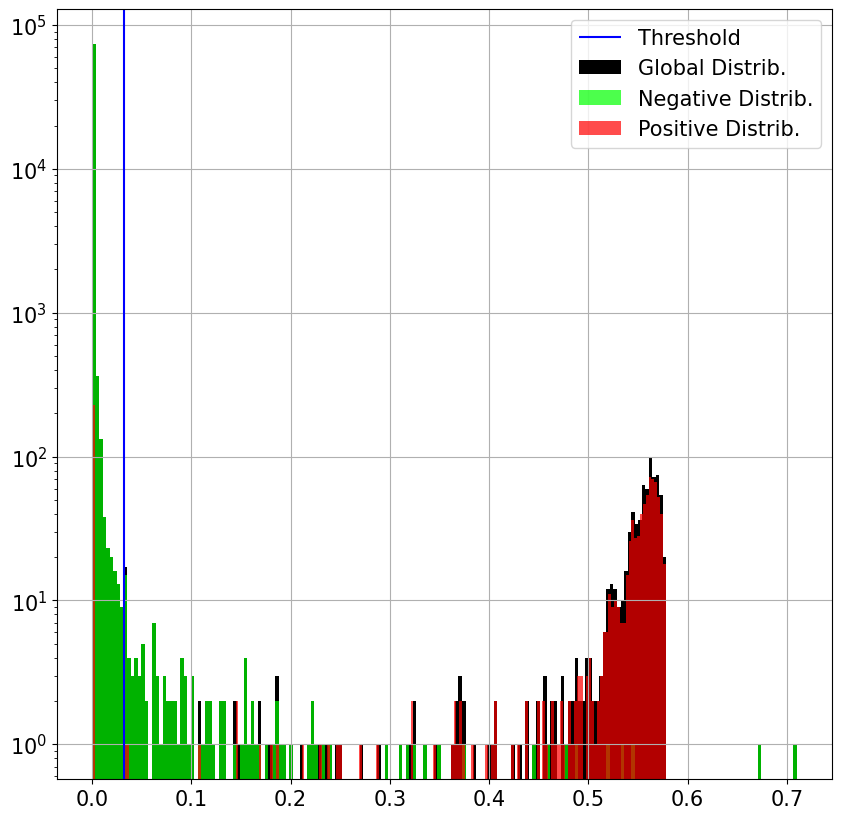

In [36]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

# Window size 24

In [37]:
window_size = 24
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g.y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [38]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT)
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device,  NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA, MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 6614.110968687054, Train Acc at 50%: 0.9963891686504304


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 779.1645303058048, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 612.3231550997986, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 588.784425929317, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 584.1356436550083, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 579.9268906793627, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 574.4553653177073, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 568.1759293169749, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 560.4988555209668, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 552.4589818714521, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 542.215574070683, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 531.480040285662, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 521.1698406885185, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 511.6174693279619, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 504.23319904779345, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 496.7085698590002, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 486.7348928767625, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 482.1090917414393, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 478.3733748397729, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 472.4710217908808, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 470.2245467863029, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 470.4976652627724, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 465.95495330525546, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 464.63633034242815, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 463.39269364585243, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 462.25256363303424, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 457.042437282549, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 458.5852865775499, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 455.4656656290057, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 460.7863028749313, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 460.7789782091192, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 457.05250869804064, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 451.9125160227065, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 448.64631019959717, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 446.1963468229262, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 448.5103003112983, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 445.54751876945613, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 442.8914118293353, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 443.16636147225785, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 440.7485350668376, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 441.6881065738876, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 439.07741256180185, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 438.4768815235305, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 440.4486357809925, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 440.18416956601357, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 435.8106573887566, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 434.14168650430327, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 433.8769456143564, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 433.0081944698773, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 432.95229811389856, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 428.94103644021243, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 430.9953305255448, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 425.85954953305253, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 427.61971250686685, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 426.3090551181102, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 426.21236952939023, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 424.24793993774034, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 421.05681193920526, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 420.21241530855156, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 420.69479033144114, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 417.39626442043584, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 417.7441402673503, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 413.2760941219557, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 415.29275773667825, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 413.60208752975643, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 412.00402856619667, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 410.1160959531221, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 410.6142647866691, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 406.4447445522798, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 404.1799578831716, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 402.7956876030031, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 403.8960355246292, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 404.4120124519319, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 404.03845449551363, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 395.7464750045779, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 392.9040468778612, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 402.0296648965391, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 397.4472166269914, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 389.21598608313496, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 389.46877861197584, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 393.512223036074, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 392.3636238784105, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 393.64489104559607, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 389.12653360190444, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 379.34215345174874, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 377.49638344625527, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 379.7908807910639, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 382.07281175608864, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 382.1752655191357, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 370.7505035707746, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 365.4030855154734, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 365.1469053286944, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 361.9102041750595, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 364.2619025819447, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 361.39907983885735, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 363.5272614905695, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 355.19366874198863, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 352.96893883904045, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 347.6763871085882, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 351.78524995422083, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 351.8699871818348, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 350.62724317890496, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 346.51952481230546, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 338.86865958615635, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 333.8586110602454, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 341.6095724226332, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 339.3641274491851, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 327.4036577549899, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 328.58098333638526, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 328.8856894341696, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 330.5202572788867, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 320.52499542208386, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 330.0387520600623, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 330.81390770921075, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 322.4985121772569, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 313.0483656839407, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 310.18657297198314, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 315.10799304156745, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 321.96202618568026, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 322.23608313495697, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 318.2266984068852, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 303.7812671671855, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 306.59826496978576, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 307.9997482146127, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 303.7996017212965, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 298.8658670573155, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 297.1369025819447, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 302.6228483794177, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 296.12669382896905, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 298.8453351034609, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 295.51485533785024, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 293.01485533785024, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 290.89113715436736, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 290.38484251968504, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 289.9148278703534, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 289.3841100531038, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 286.8469144845266, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 286.3092382347555, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 286.16567478483796, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 284.28357901483247, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 283.90606116095955, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 282.6695889031313, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 282.3730086064823, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 280.8579701519868, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 279.29992217542576, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 280.2334737227614, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 278.6633858267717, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 276.8030122688152, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 276.9253341878777, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 275.47253250320455, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 275.5681422816334, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 274.01700695843255, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 273.7834187877678, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 272.8945477018861, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 271.6407251419154, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 272.4610648232924, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 270.2082265152902, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 270.65871635231645, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 269.7117515107123, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 267.98564823292435, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 269.83167002380515, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 268.02531587621314, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 266.14999542208386, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 268.12811298297015, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 266.61616462186413, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 264.41938289690535, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 266.39285387291704, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 264.3924418604651, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 262.77089818714524, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 263.83592748580844, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 261.95168009522064, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 261.808391320271, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 261.6643471891595, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 260.4893792345724, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 260.6751281816517, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 259.84892876762495, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 259.28882072880424, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 259.12992125984255, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 258.55129555026554, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 258.0749862662516, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 257.8202252334737, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 257.1653543307087, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 256.8843160593298, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 256.5531724958799, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 256.04220838674235, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 255.75636330342428, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 255.43247573704448, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 254.96358267716536, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 254.65523713605566, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 254.30157022523346, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 253.98647225782824, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 253.6688335469694, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 253.32670298480133, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 253.05145577733015, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 252.671374290423, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 252.5003662332906, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 252.11259384728072, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 251.8874519318806, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 251.54165903680644, Train Acc at 50%: 0.9967554019410364


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 251.3542849295001, Train Acc at 50%: 0.9967554019410364


In [39]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

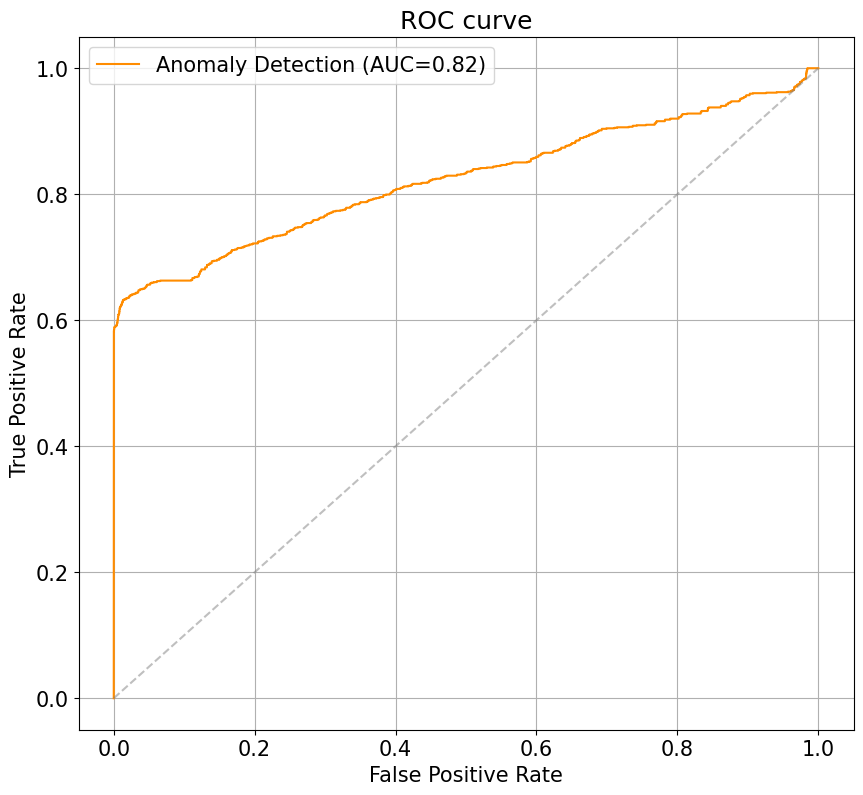


Best probability threshold: p=0.55%


In [40]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")


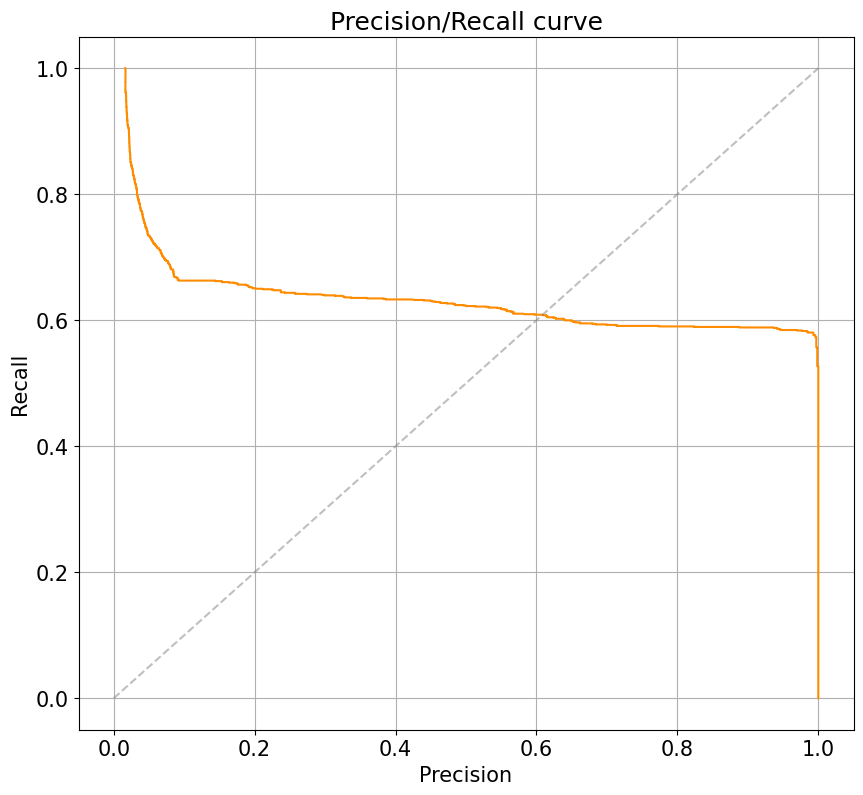

In [41]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

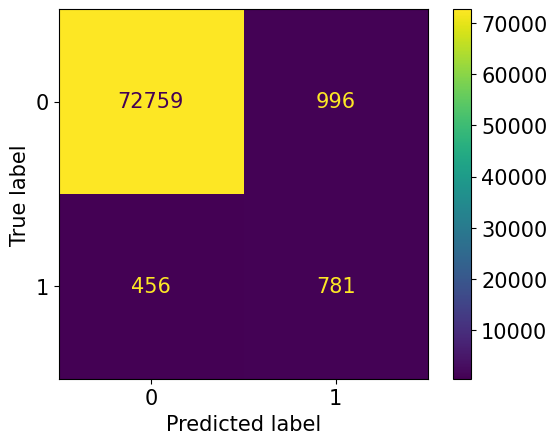


Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     73755
           1       0.44      0.63      0.52      1237

    accuracy                           0.98     74992
   macro avg       0.72      0.81      0.75     74992
weighted avg       0.98      0.98      0.98     74992



In [42]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

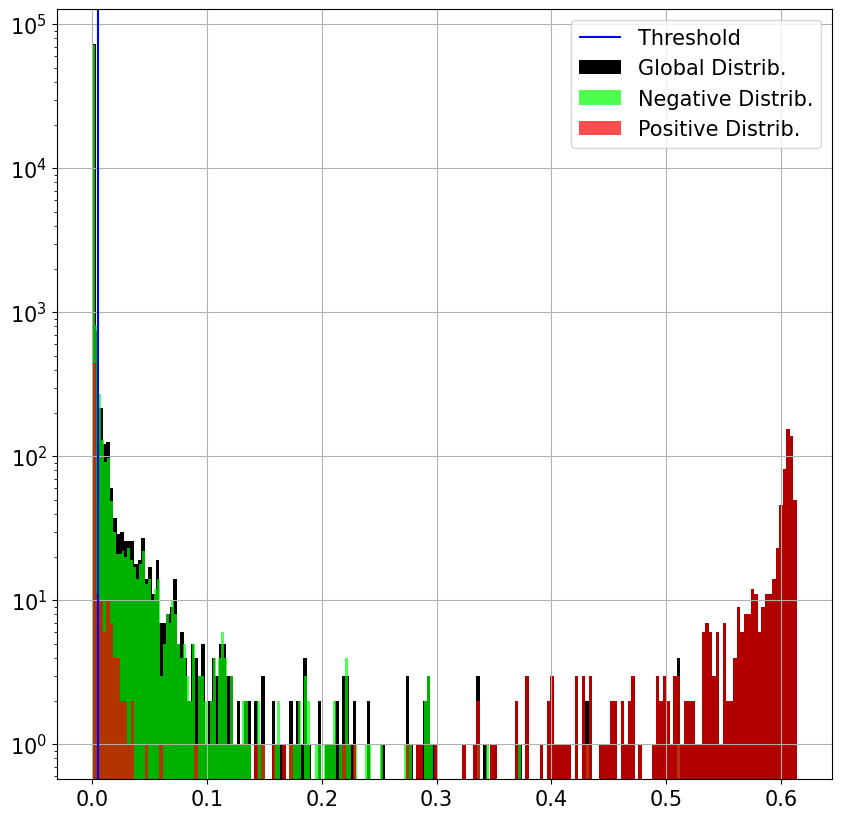

In [43]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

# Window size 64

In [44]:
window_size = 64
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g.y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [45]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT)
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device,  NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA, MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 3842.606848562534, Train Acc at 50%: 0.9938713147775132


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 738.6006683757554, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 579.8605108954404, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 583.4432338399561, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 582.2398370261857, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 581.9597601171946, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 580.4523438930598, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 578.5255447720198, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 576.0515931148142, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 573.3883446255264, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 570.0301684673137, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 567.1386193004944, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 563.2472990294817, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 560.7223493865592, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 556.6767075627174, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 553.921442959165, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 550.5377220289324, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 547.8515839589819, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 545.1868247573705, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 541.6389397546237, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 540.1453488372093, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 539.1503845449552, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 536.8194927668925, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 534.5513642190075, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 532.0246291887933, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 533.2714704266618, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 529.2294909357261, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 525.9470792895074, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 524.5634499175975, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 522.1323017762314, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 520.9600347921626, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 518.111289141183, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 517.8404596227797, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 515.2485350668376, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 514.0099340780077, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 518.9666269913935, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 511.6803698956235, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 508.31404504669473, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 507.18197216626993, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 506.18133125801137, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 507.4512909723494, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 506.42368613806997, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 500.46186595861565, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 499.6018586339498, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 497.41604101812857, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 497.0796557407068, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 493.36334920344257, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 498.683391320271, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 491.9854422266984, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 493.24313312580114, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 487.4990844167735, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 489.5440853323567, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 484.29078923274125, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 486.6114722578282, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 481.39681377037175, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 483.97807178172496, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 478.4741805530123, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 493.78827137886833, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 479.2450558505768, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 476.06248855520965, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 471.33757553561617, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 483.5627174510163, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 476.42830983336387, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 481.3111151803699, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 472.5097967405237, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 470.64859915766345, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 464.0643197216627, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 466.6041933711774, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 461.16746017212967, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 462.69016663614724, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 457.0264603552463, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 460.0012818165171, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 452.8644479033144, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 456.7894616370628, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 449.8805621681011, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 442.26698406885185, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 473.0863852774217, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 490.08931514374655, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 473.6951107855704, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 456.4028108405054, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 455.32901483244825, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 441.62149789415855, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 451.7394707928951, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 444.1360098882989, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 439.2662058231093, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 435.0519135689434, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 437.1991393517671, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 428.2231276323018, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 425.11051089544037, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 430.7829152169932, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 421.6787218458158, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 421.2018403222853, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 412.5797930781908, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 426.63651345907346, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 416.433391320271, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 405.8465024720747, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 417.19588903131296, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 414.0152902398828, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 413.2891411829335, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 412.5513642190075, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 402.4745467863029, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 399.72381431972167, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 398.9029939571507, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 395.0090642739425, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 389.42812671671857, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 388.4713422450101, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 386.7042666178356, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 380.63257645119944, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 385.1022248672404, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 382.6941723127632, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 372.5700421168284, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 380.6925929316975, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 381.28827137886833, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 365.4615912836477, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 375.9260437648782, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 369.05415674784837, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 367.1422129646585, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 367.5489150338766, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 366.4787126899835, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 359.36405878044314, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 358.8312580113532, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 354.1856116095953, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 357.0798617469328, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 345.713674235488, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 355.8152581944699, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 351.45593755722393, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 344.39679088079106, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 339.12010162973814, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 340.5969144845266, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 335.52696392602087, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 335.30720106207656, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 334.60872550814867, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 334.53051181102364, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 330.2777192821828, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 327.47949093572606, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 329.0112845632668, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 324.8909998168834, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 322.7348928767625, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 327.21646676432886, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 326.67471616919977, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 318.22745376304704, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 318.02494964292254, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 314.5811435634499, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 314.2117515107123, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 320.7242034425929, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 319.3257874015748, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 310.5871177440029, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 308.46616919978027, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 308.3529115546603, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 311.818439846182, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 305.98532777879507, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 307.8726652627724, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 307.9804294085332, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 307.005905511811, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 301.1449139351767, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 303.11760666544586, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 299.2835561252518, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 303.7718366599524, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 300.14914850759936, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 299.1395806628823, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 295.75100714154917, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 296.66844442409814, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 296.4206876030031, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 298.4761490569493, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 292.77124153085515, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 295.2854559604468, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 292.15821278154186, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 293.23553378502106, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 289.1626762497711, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 290.79067478483796, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 288.8534609045962, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 290.3998580845999, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 287.5065693096503, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 288.2986632484893, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 286.57631386193003, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 289.6219556857718, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 284.01545046694747, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 286.225965940304, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 283.2859366416407, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 284.2716764328878, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 282.83508057132394, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 284.0880562168101, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 280.624793993774, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 281.9226332173595, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 280.10732924372826, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 281.5314502838308, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 279.06958432521515, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 281.2863028749313, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 278.41512543490205, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 279.60071415491666, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 276.88825306720383, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 278.4157434535799, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 276.91629280351583, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 278.5172816334005, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 274.9884407617652, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 276.6103735579564, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 274.1977430873466, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 275.13507141549167, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 274.131248855521, Train Acc at 50%: 0.9942375480681194


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 275.2247527925288, Train Acc at 50%: 0.9942375480681194


In [46]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

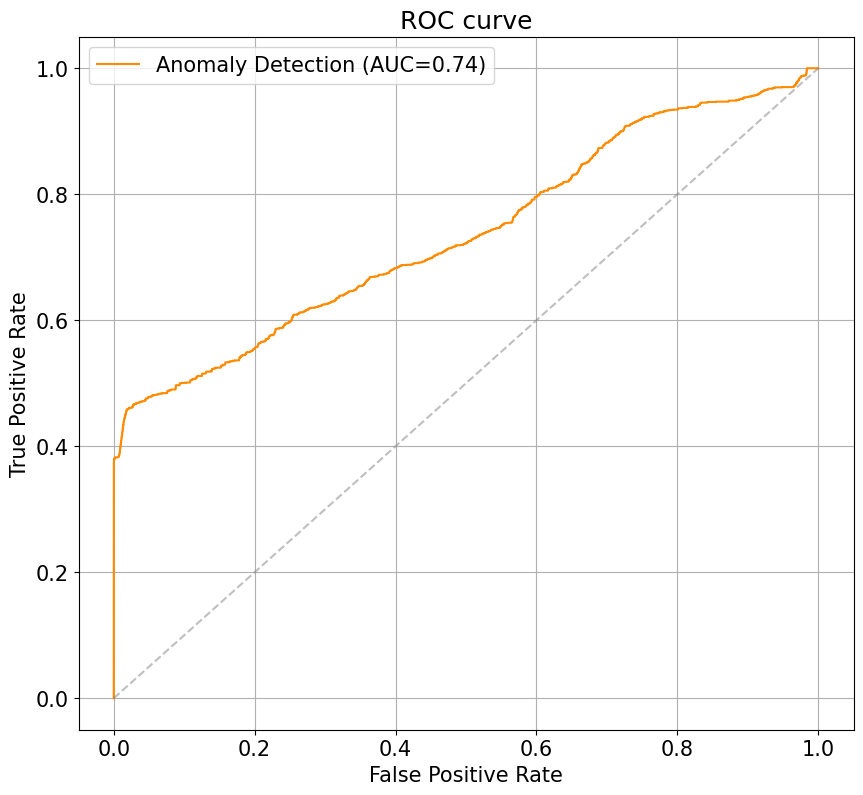


Best probability threshold: p=2.10%


In [47]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

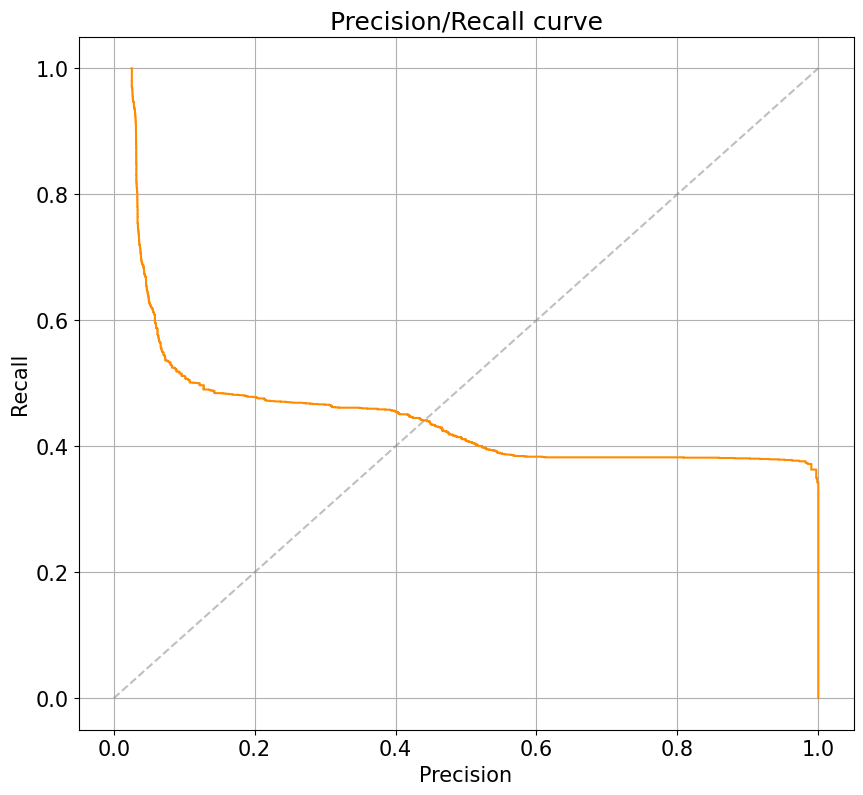

In [48]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

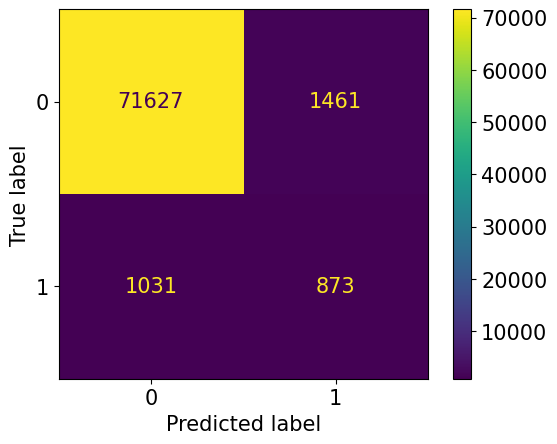


Classification Report
              precision    recall  f1-score   support

           0       0.99      0.98      0.98     73088
           1       0.37      0.46      0.41      1904

    accuracy                           0.97     74992
   macro avg       0.68      0.72      0.70     74992
weighted avg       0.97      0.97      0.97     74992



In [49]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

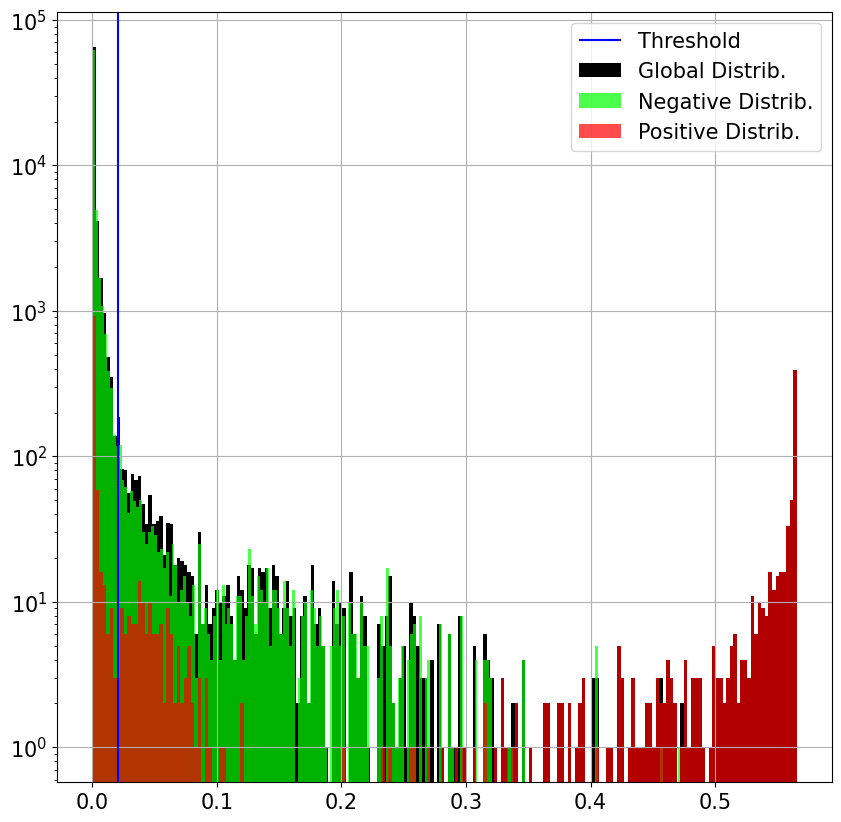

In [50]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

# Window size 192

In [51]:
window_size = 192
labels = compute_labels(data,window_size)
for i,g in enumerate(data_list):
  g.y = labels[i]

  0%|          | 0/2963 [00:00<?, ?it/s]

In [52]:
train_data, test_data = train_test_split(data_list,TRAIN_SPLIT)
logpath = f'{BASE_LOGPATH}/{window_size:02d}'
logger_name = f'{logpath}/{LOGGER_NAME}'
model = train(train_data, logpath, logger_name,device,  NUM_EPOCHS, INITIAL_LR, TRAIN_BATCH_SIZE,ES_PATIENCE, ES_MIN_DELTA, MAX_NUM_CKPT,APPLY_WEIGHT_BALANCING)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 1/200	 Train Loss: 2642.5784654825125, Train Acc at 50%: 0.9852076084966124


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 2/200	 Train Loss: 683.1544588903131, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 3/200	 Train Loss: 531.2960996154551, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 4/200	 Train Loss: 552.278383080022, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 5/200	 Train Loss: 549.3872459256546, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 6/200	 Train Loss: 550.8273667826405, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 7/200	 Train Loss: 550.6455319538546, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 8/200	 Train Loss: 550.0209210767259, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 9/200	 Train Loss: 552.4468961728621, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 10/200	 Train Loss: 547.9638802417139, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 11/200	 Train Loss: 545.873374839773, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 12/200	 Train Loss: 543.5415674784838, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 13/200	 Train Loss: 541.558459989013, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 14/200	 Train Loss: 539.4026735030214, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 15/200	 Train Loss: 537.590642739425, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 16/200	 Train Loss: 535.6732283464567, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 17/200	 Train Loss: 533.7303149606299, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 18/200	 Train Loss: 532.5446346822927, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 19/200	 Train Loss: 536.121131660868, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 20/200	 Train Loss: 530.8802874931331, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 21/200	 Train Loss: 527.2426295550265, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 22/200	 Train Loss: 525.6917689067936, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 23/200	 Train Loss: 523.7016114264786, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 24/200	 Train Loss: 521.7618568027834, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 25/200	 Train Loss: 518.7245925654641, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 26/200	 Train Loss: 536.4200238051639, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 27/200	 Train Loss: 527.8481047427211, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 28/200	 Train Loss: 519.9396172862113, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 29/200	 Train Loss: 517.1149972532503, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 30/200	 Train Loss: 514.6057498626625, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 31/200	 Train Loss: 536.5469694195202, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 32/200	 Train Loss: 517.6008514924007, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 33/200	 Train Loss: 510.4445156564732, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 34/200	 Train Loss: 509.0165720563999, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 35/200	 Train Loss: 507.155420252701, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 36/200	 Train Loss: 506.21296465848746, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 37/200	 Train Loss: 503.9026277238601, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 38/200	 Train Loss: 503.37598425196853, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 39/200	 Train Loss: 501.5787401574803, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 40/200	 Train Loss: 499.7478483794177, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 41/200	 Train Loss: 498.3592748580846, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 42/200	 Train Loss: 497.05534700604284, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 43/200	 Train Loss: 492.0378593664164, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 44/200	 Train Loss: 515.3151895257279, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 45/200	 Train Loss: 506.08734663980954, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 46/200	 Train Loss: 497.43737410730637, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 47/200	 Train Loss: 495.2583775865226, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 48/200	 Train Loss: 493.19071598608315, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 49/200	 Train Loss: 491.488051638894, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 50/200	 Train Loss: 493.941677348471, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 51/200	 Train Loss: 489.8662790697674, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 52/200	 Train Loss: 494.85671122505033, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 53/200	 Train Loss: 488.5983336385277, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 54/200	 Train Loss: 484.6885185863395, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 55/200	 Train Loss: 484.064365500824, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 56/200	 Train Loss: 482.6228712689983, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 57/200	 Train Loss: 481.741851309284, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 58/200	 Train Loss: 480.5942135140084, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 59/200	 Train Loss: 479.9875480681194, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 60/200	 Train Loss: 481.08505768174325, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 61/200	 Train Loss: 477.56706647134223, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 62/200	 Train Loss: 476.5226149056949, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 63/200	 Train Loss: 475.5755356161875, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 64/200	 Train Loss: 474.6869163156931, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 65/200	 Train Loss: 474.3141366050174, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 66/200	 Train Loss: 472.8239333455411, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 67/200	 Train Loss: 472.3371177440029, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 68/200	 Train Loss: 471.0168925105292, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 69/200	 Train Loss: 469.97715619849845, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 70/200	 Train Loss: 469.19959714338034, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 71/200	 Train Loss: 468.43059879143016, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 72/200	 Train Loss: 467.54115546603185, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 73/200	 Train Loss: 466.94195202343894, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 74/200	 Train Loss: 465.3712232191906, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 75/200	 Train Loss: 464.4459805896356, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 76/200	 Train Loss: 464.00805713239333, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 77/200	 Train Loss: 462.6774400292987, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 78/200	 Train Loss: 461.7499542208387, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 79/200	 Train Loss: 460.9656656290057, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 80/200	 Train Loss: 460.241851309284, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 81/200	 Train Loss: 458.6788591832998, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 82/200	 Train Loss: 458.11170115363484, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 83/200	 Train Loss: 456.97523347372277, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 84/200	 Train Loss: 455.72592016114265, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 85/200	 Train Loss: 454.9819172312763, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 86/200	 Train Loss: 454.02833730086064, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 87/200	 Train Loss: 453.08217359457973, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 88/200	 Train Loss: 452.05411096868704, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 89/200	 Train Loss: 450.80273759384727, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 90/200	 Train Loss: 449.02124153085515, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 91/200	 Train Loss: 449.2053653177074, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 92/200	 Train Loss: 447.7923457242263, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 93/200	 Train Loss: 447.7222578282366, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 94/200	 Train Loss: 452.4397546236953, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 95/200	 Train Loss: 445.12131477751325, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 96/200	 Train Loss: 442.9739058780443, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 97/200	 Train Loss: 442.05694927668924, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 98/200	 Train Loss: 439.95408350119027, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 99/200	 Train Loss: 439.6466764328878, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 100/200	 Train Loss: 438.2788408716352, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 101/200	 Train Loss: 436.85877128731, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 102/200	 Train Loss: 437.26789965207837, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 103/200	 Train Loss: 434.651483244827, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 104/200	 Train Loss: 433.8455868888482, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 105/200	 Train Loss: 430.7194195202344, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 106/200	 Train Loss: 431.75860648232924, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 107/200	 Train Loss: 428.4882805347006, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 108/200	 Train Loss: 434.066608679729, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 109/200	 Train Loss: 426.32191906244276, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 110/200	 Train Loss: 425.4228621131661, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 111/200	 Train Loss: 424.64411279985353, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 112/200	 Train Loss: 422.8077733015931, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 113/200	 Train Loss: 421.8351950192272, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 114/200	 Train Loss: 421.40661051089546, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 115/200	 Train Loss: 418.61348654092654, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 116/200	 Train Loss: 419.5204175059513, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 117/200	 Train Loss: 415.42295367148876, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 118/200	 Train Loss: 422.9029481779894, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 119/200	 Train Loss: 415.01712140633583, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 120/200	 Train Loss: 411.8644479033144, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 121/200	 Train Loss: 414.9232283464567, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 122/200	 Train Loss: 410.05232558139534, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 123/200	 Train Loss: 413.4641091375206, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 124/200	 Train Loss: 407.86705731550995, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 125/200	 Train Loss: 408.889122871269, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 126/200	 Train Loss: 405.09059696026367, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 127/200	 Train Loss: 406.3038820728804, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 128/200	 Train Loss: 402.8479674052371, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 129/200	 Train Loss: 404.14305987914304, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 130/200	 Train Loss: 400.98068119392053, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 131/200	 Train Loss: 400.6034609045962, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 132/200	 Train Loss: 398.1334004761033, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 133/200	 Train Loss: 399.30076908991026, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 134/200	 Train Loss: 396.10263687969234, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 135/200	 Train Loss: 396.27458340963193, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 136/200	 Train Loss: 393.5085149240066, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 137/200	 Train Loss: 395.4793993774034, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 138/200	 Train Loss: 391.34160410181283, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 139/200	 Train Loss: 391.5044863578099, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 140/200	 Train Loss: 388.6948818897638, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 141/200	 Train Loss: 389.79770188610144, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 142/200	 Train Loss: 386.471754257462, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 143/200	 Train Loss: 387.0195934810474, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 144/200	 Train Loss: 384.2623145943966, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 145/200	 Train Loss: 385.85730635414757, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 146/200	 Train Loss: 382.8225370811207, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 147/200	 Train Loss: 382.1337209302326, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 148/200	 Train Loss: 380.36227339315144, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 149/200	 Train Loss: 381.76627449185133, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 150/200	 Train Loss: 377.9281496062992, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 151/200	 Train Loss: 380.08789598974545, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 152/200	 Train Loss: 375.98194012085696, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 153/200	 Train Loss: 376.1272889580663, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 154/200	 Train Loss: 374.45934810474273, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 155/200	 Train Loss: 376.0755813953488, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 156/200	 Train Loss: 371.0062259659403, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 157/200	 Train Loss: 372.10460538362935, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 158/200	 Train Loss: 368.5270325947629, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 159/200	 Train Loss: 369.0672724775682, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 160/200	 Train Loss: 366.66240157480314, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 161/200	 Train Loss: 367.24052371360557, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 162/200	 Train Loss: 364.487708295184, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 163/200	 Train Loss: 364.9362982970152, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 164/200	 Train Loss: 362.1057498626625, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 165/200	 Train Loss: 362.2349386559238, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 166/200	 Train Loss: 360.4706555575902, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 167/200	 Train Loss: 360.7388985533785, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 168/200	 Train Loss: 358.50547060977846, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 169/200	 Train Loss: 357.7029390221571, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 170/200	 Train Loss: 356.3129234572423, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 171/200	 Train Loss: 355.54861746932795, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 172/200	 Train Loss: 354.6374061527193, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 173/200	 Train Loss: 353.38843618384914, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 174/200	 Train Loss: 352.7014740889947, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 175/200	 Train Loss: 351.8684078007691, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 176/200	 Train Loss: 351.01593114814136, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 177/200	 Train Loss: 349.56445705914666, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 178/200	 Train Loss: 350.7751098699872, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 179/200	 Train Loss: 347.6980635414759, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 180/200	 Train Loss: 347.59215345174874, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 181/200	 Train Loss: 346.0316562900568, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 182/200	 Train Loss: 345.41386650796557, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 183/200	 Train Loss: 344.356665445889, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 184/200	 Train Loss: 348.76329884636516, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 185/200	 Train Loss: 343.3520646401758, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 186/200	 Train Loss: 342.2434078007691, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 187/200	 Train Loss: 341.8249862662516, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 188/200	 Train Loss: 340.4538774949643, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 189/200	 Train Loss: 339.4941402673503, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 190/200	 Train Loss: 339.5940761765244, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 191/200	 Train Loss: 337.6896859549533, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 192/200	 Train Loss: 338.8015015564915, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 193/200	 Train Loss: 335.6045367148874, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 194/200	 Train Loss: 337.97024354513826, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 195/200	 Train Loss: 334.21095037538913, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 196/200	 Train Loss: 335.685291155466, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 197/200	 Train Loss: 332.82761856802784, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 198/200	 Train Loss: 333.8149148507599, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 199/200	 Train Loss: 331.79932704632853, Train Acc at 50%: 0.9855738417872184


  0%|          | 0/32 [00:00<?, ?it/s]

Epoch 200/200	 Train Loss: 331.94607214795826, Train Acc at 50%: 0.9855738417872184


In [53]:
test_loader = DataLoader(test_data, batch_size = TEST_BATCH_SIZE, shuffle = False)
predictions = get_predictions(model,test_loader,device)
predictions.to_csv(os.path.join(logpath,'predictions.csv'))

  0%|          | 0/14 [00:00<?, ?it/s]

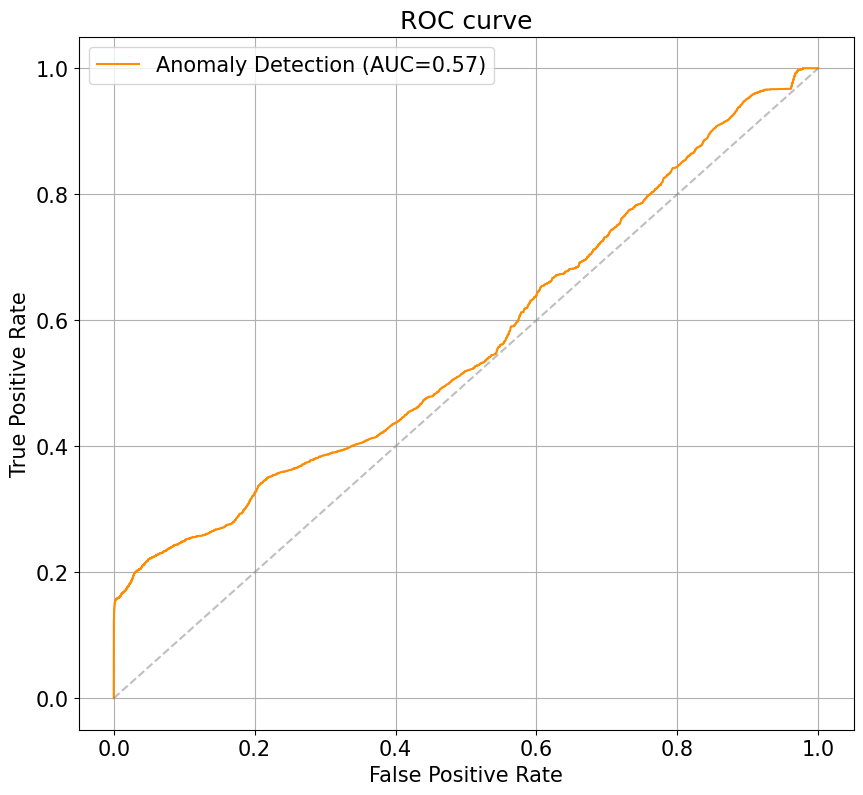


Best probability threshold: p=3.48%


In [54]:
fpr,tpr,thr = plot_roc_curve(predictions,save_as=os.path.join(logpath,'ROC_curve.png'))
th = thr[np.argmax(tpr-fpr)]
print(f"\nBest probability threshold: p={th*100:.2f}%")

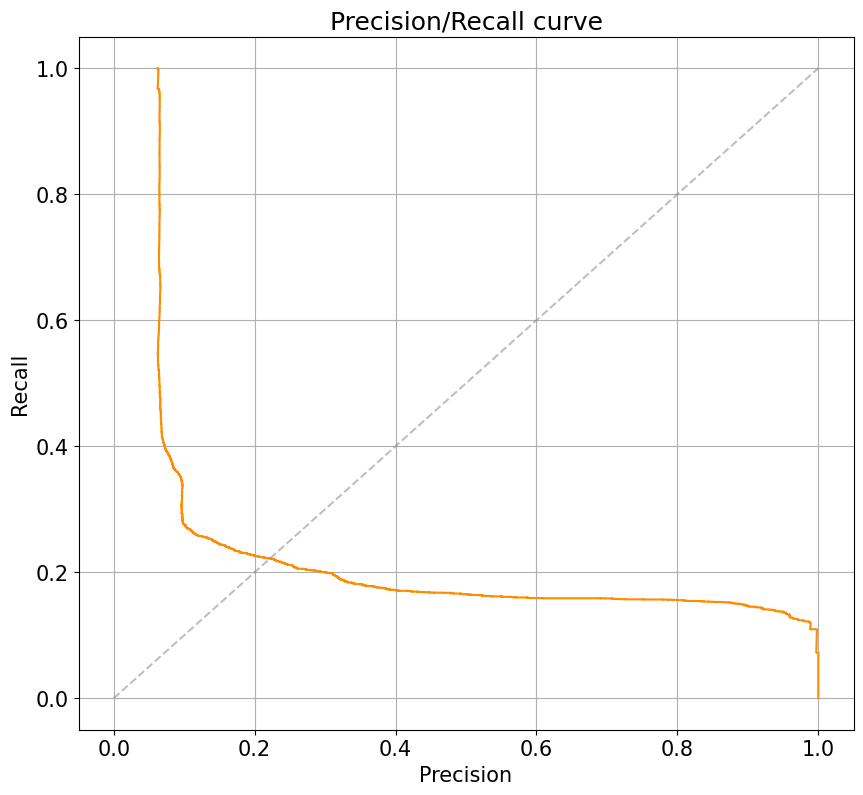

In [55]:
plot_pr_curve(predictions,save_as=os.path.join(logpath,'PR_curve.png'))

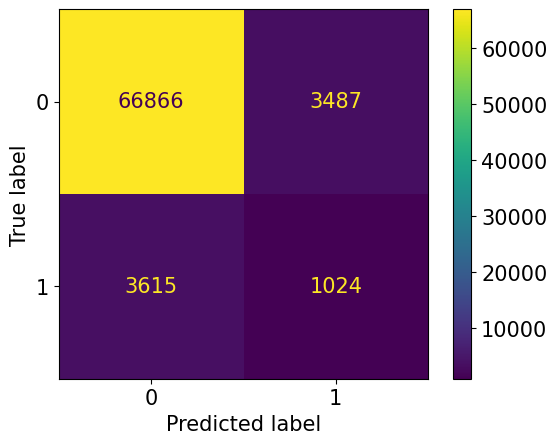


Classification Report
              precision    recall  f1-score   support

           0       0.95      0.95      0.95     70353
           1       0.23      0.22      0.22      4639

    accuracy                           0.91     74992
   macro avg       0.59      0.59      0.59     74992
weighted avg       0.90      0.91      0.90     74992



In [56]:
plot_classification_report(predictions,th,save_fig_as=os.path.join(logpath,'CM.png'))

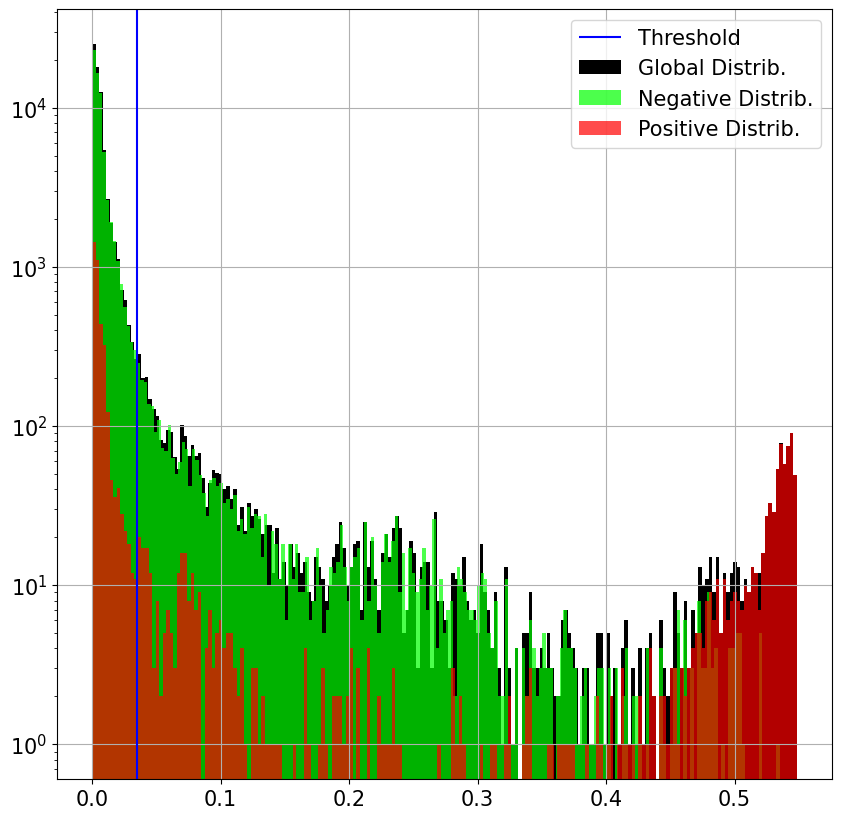

In [57]:
plot_distributions(predictions, th,save_as=os.path.join(logpath,'Prob_distr.png'))

In [58]:
! rm -r drive/MyDrive/HPCDATA/simple2
! cp -r out drive/MyDrive/HPCDATA/simple2

rm: cannot remove 'drive/MyDrive/HPCDATA/simple2': No such file or directory
